In [4]:
import warnings
warnings.filterwarnings('ignore')

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import load_iris
from sklearn.datasets import make_blobs
from sklearn.model_selection import StratifiedKFold, cross_val_predict
from sklearn.preprocessing import label_binarize
from sklearn.metrics import accuracy_score, precision_score, recall_score, confusion_matrix, roc_curve, roc_auc_score
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn.naive_bayes import GaussianNB

# 1.

In [6]:
n_samples = 1000
n_features = 4
n_classes = 2
centers = [[1, 1, 1, 1],  [-1, 1, -1, 1]]
transformation = np.array([
    [0.8, -0.5, 0.3, 0.1],
    [-0.4, 0.9, -0.2, 0.3],
    [0.2, -0.1, 0.8, -0.5],
    [-0.9, 0.3, -0.4, 0.7]
])

X, y = make_blobs(n_samples=[n_samples]*n_classes, centers=centers, random_state=52, n_features=n_features)
X = np.dot(X, transformation)

df = pd.DataFrame(X, columns=[f"feature_{i+1}" for i in range(n_features)])
df['class'] = y
df

,feature_1,feature_2,feature_3,feature_4,class
0,-4.261338,3.746215,-2.688498,2.685329,1
1,-3.344670,1.983807,-1.495087,2.152630,0
2,-3.490718,2.932746,-1.626188,2.204123,0
3,-2.471060,2.292305,-2.343300,0.642340,1
4,-0.711448,0.688030,0.141949,0.714698,0
...,...,...,...,...,...
1995,-2.217623,1.757751,-1.039989,2.381691,1
1996,0.187700,2.080569,1.395284,0.631808,0
1997,-0.350228,0.292763,0.618185,0.178291,0
1998,-1.455418,1.468577,-1.157588,1.465035,1


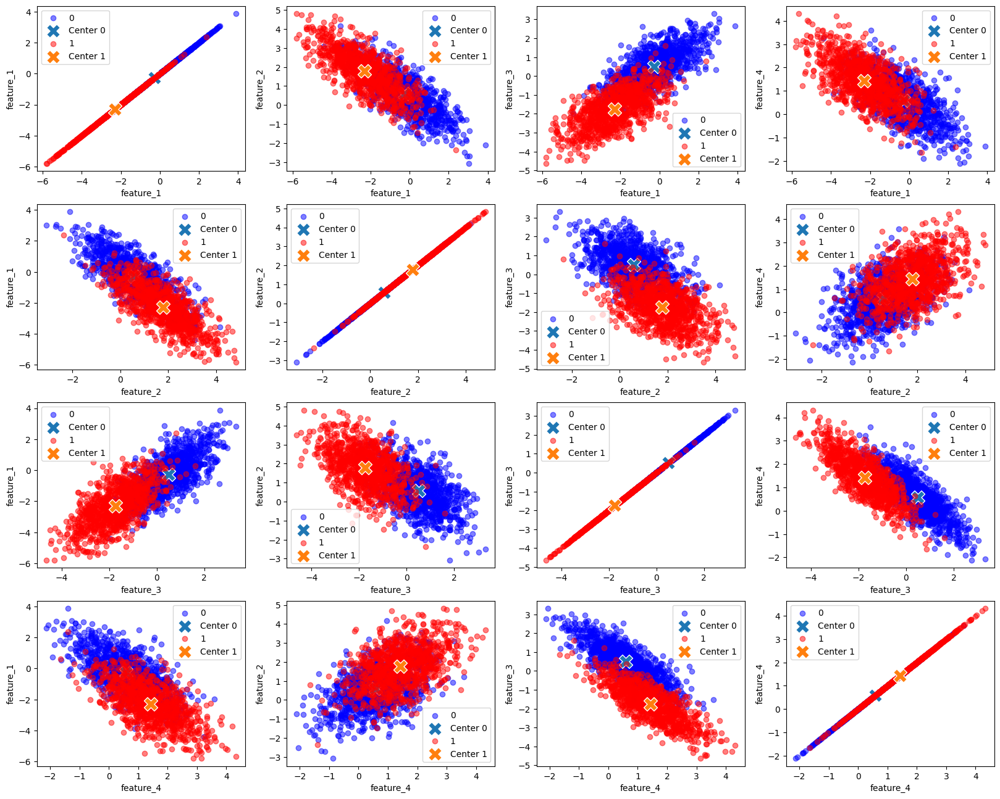

In [7]:
calculated_centers = df.groupby('class').mean()

plt.figure(figsize=(20, 16))
for i, feature_name1 in enumerate(df.drop('class', axis=1).columns):
    for j, feature_name2 in enumerate(df.drop('class', axis=1).columns):
        plt.subplot(4, 4, 4 * i + j + 1)
        plt.xlabel(feature_name1)
        plt.ylabel(feature_name2)
        dict_color = {0: 'blue', 1: 'red'}
        for label in dict_color:
            plt.scatter(df[df['class'] == label][feature_name1], 
                        df[df['class'] == label][feature_name2], 
                        c=dict_color[label], label=label, alpha=0.5)
            
            # Центры
            plt.scatter(calculated_centers.loc[label, feature_name1], 
                        calculated_centers.loc[label, feature_name2], 
                        s=250, marker='X', edgecolor='white', label=f"Center {label}")
            
        plt.legend()
plt.show()

# 2.

In [8]:
def rotate_data(X, angle_degrees, feature_index=0):
    angle_radians = np.radians(angle_degrees)
    rotation_matrix = np.array([
        [1, 0, 0, 0],
        [0, np.cos(angle_radians), -np.sin(angle_radians), 0],
        [0, np.sin(angle_radians), np.cos(angle_radians), 0],
        [0, 0, 0, 1]
    ])
    df = pd.DataFrame(np.dot(X, rotation_matrix.T), columns=[f"feature_{i+1}" for i in range(n_features)])
    df['class'] = y
    return df

In [9]:
from sklearn.preprocessing import StandardScaler

angles = [0, 15, 30, 45, 60, 75, 90]
datasets = {}
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

for angle in angles:
    rotated_X = rotate_data(X_scaled, angle)
    datasets[f"df_{angle}"] = rotated_X

datasets["df_0"]

,feature_1,feature_2,feature_3,feature_4,class
0,-1.819911,2.095020,-1.401251,1.670675,1
1,-1.259053,0.655019,-0.593316,1.140364,0
2,-1.348412,1.430363,-0.682071,1.191626,0
3,-0.724540,0.907082,-1.167553,-0.363157,1
4,0.352069,-0.403714,0.514951,-0.291124,0
...,...,...,...,...,...
1995,-0.569476,0.470317,-0.285217,1.368398,1
1996,0.902207,0.734080,1.363454,-0.373642,0
1997,0.573079,-0.726673,0.837361,-0.825126,0
1998,-0.103125,0.234043,-0.364830,0.455850,1


# 3.

## a)

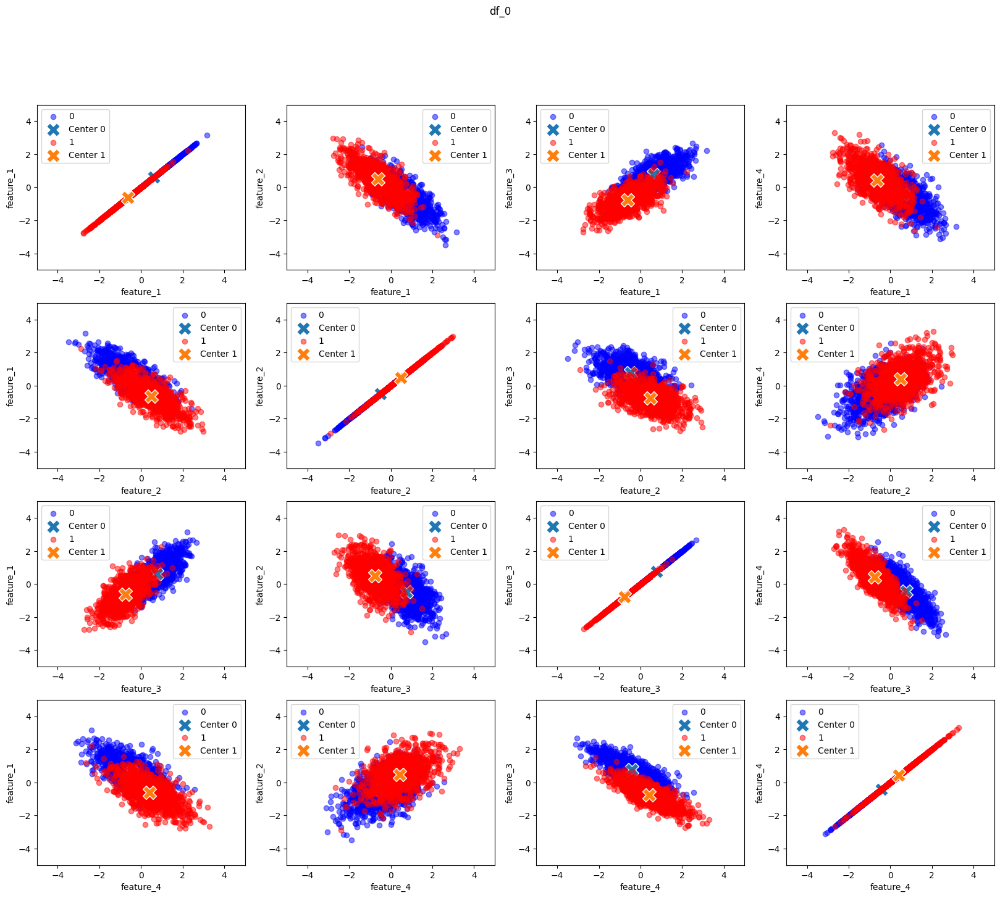

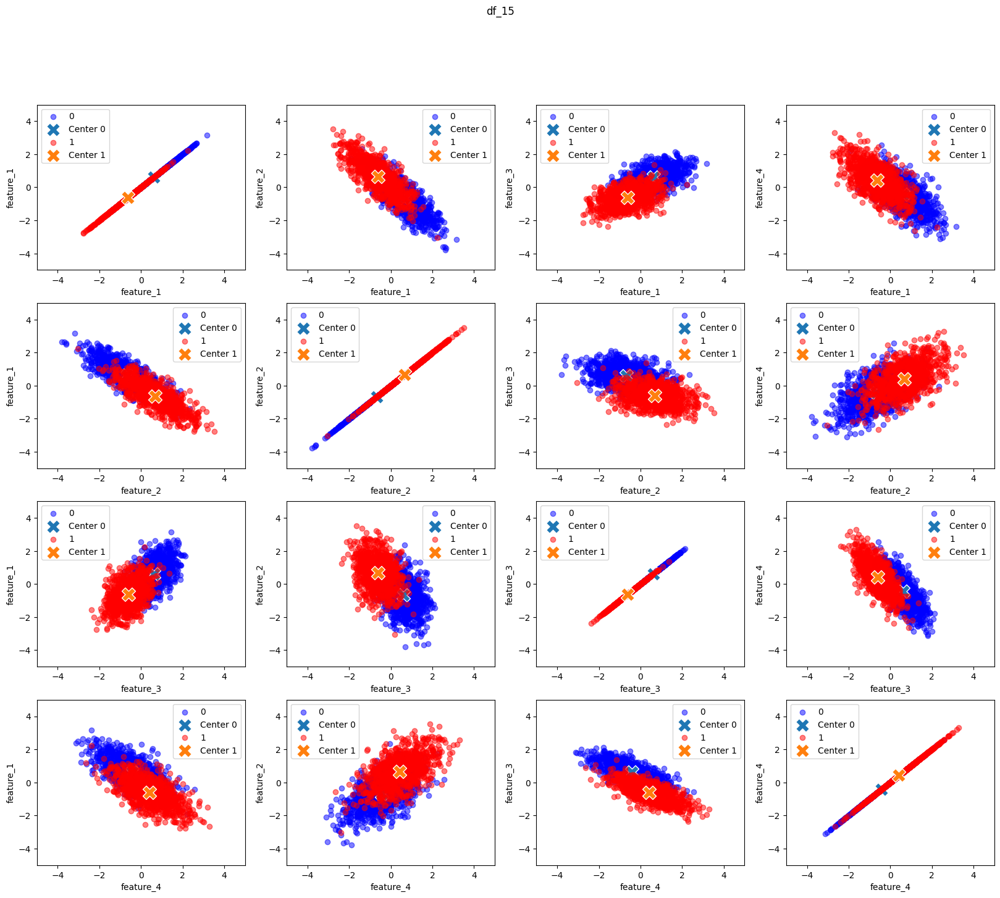

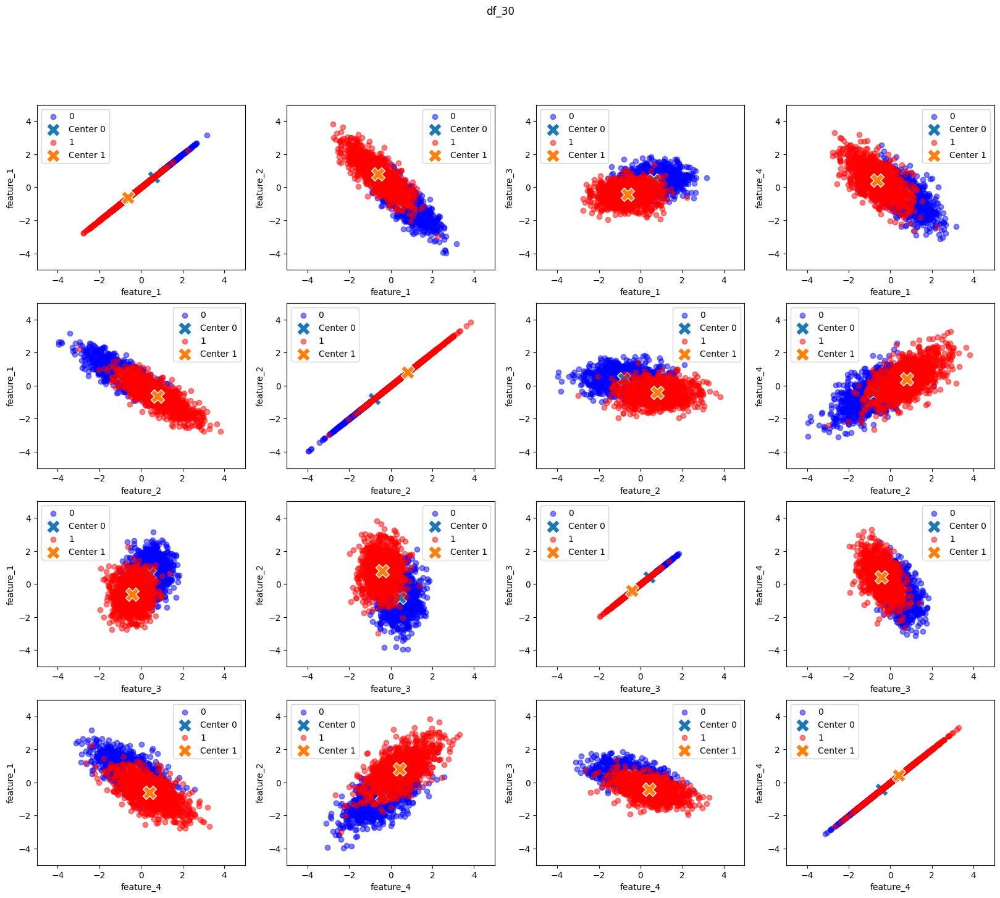

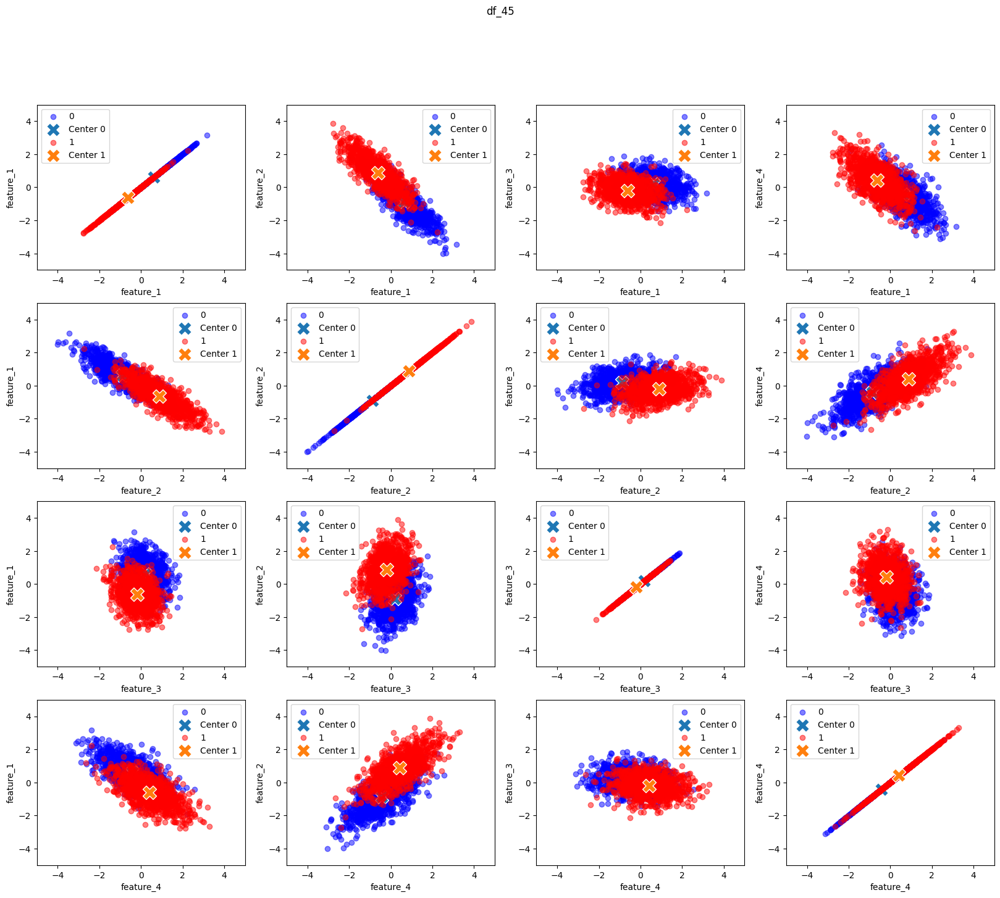

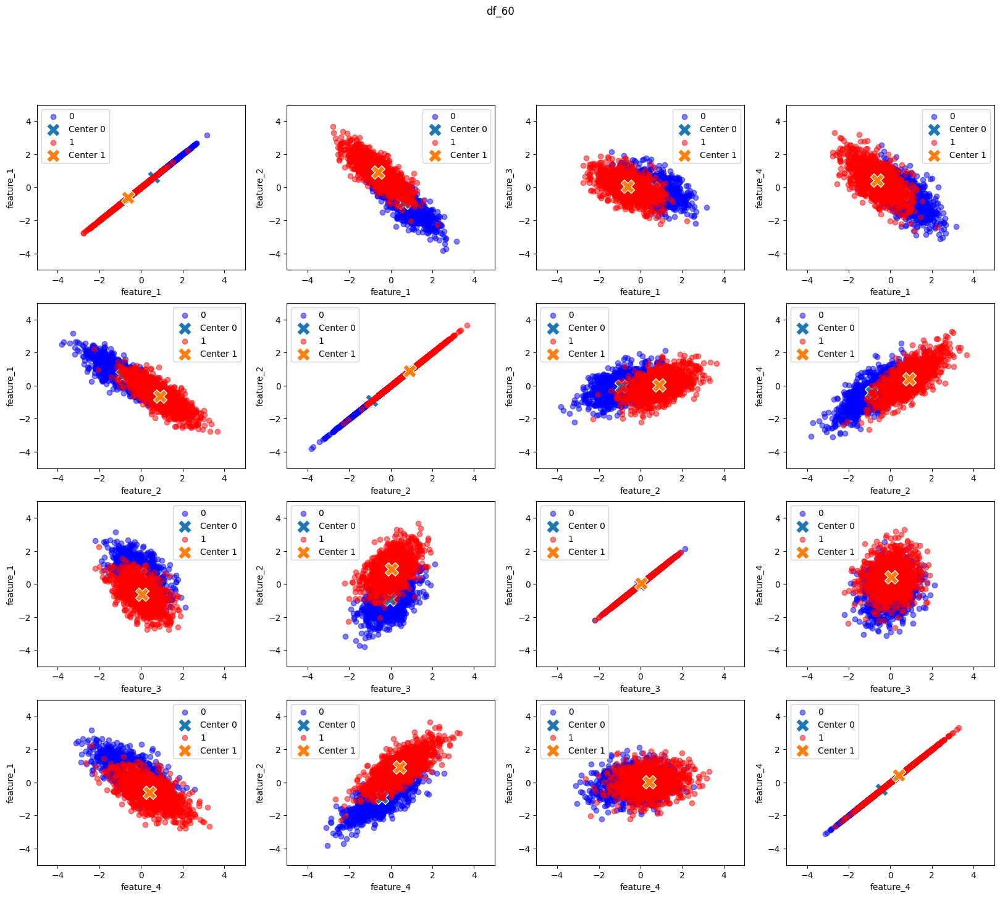

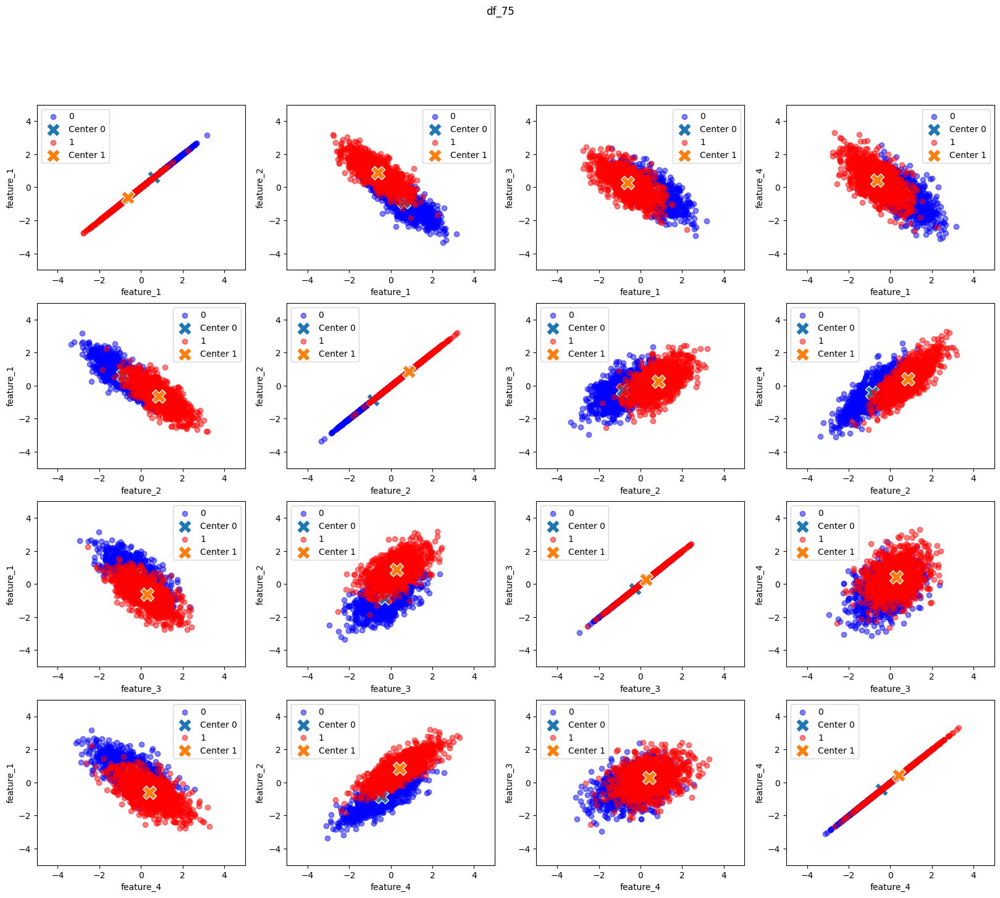

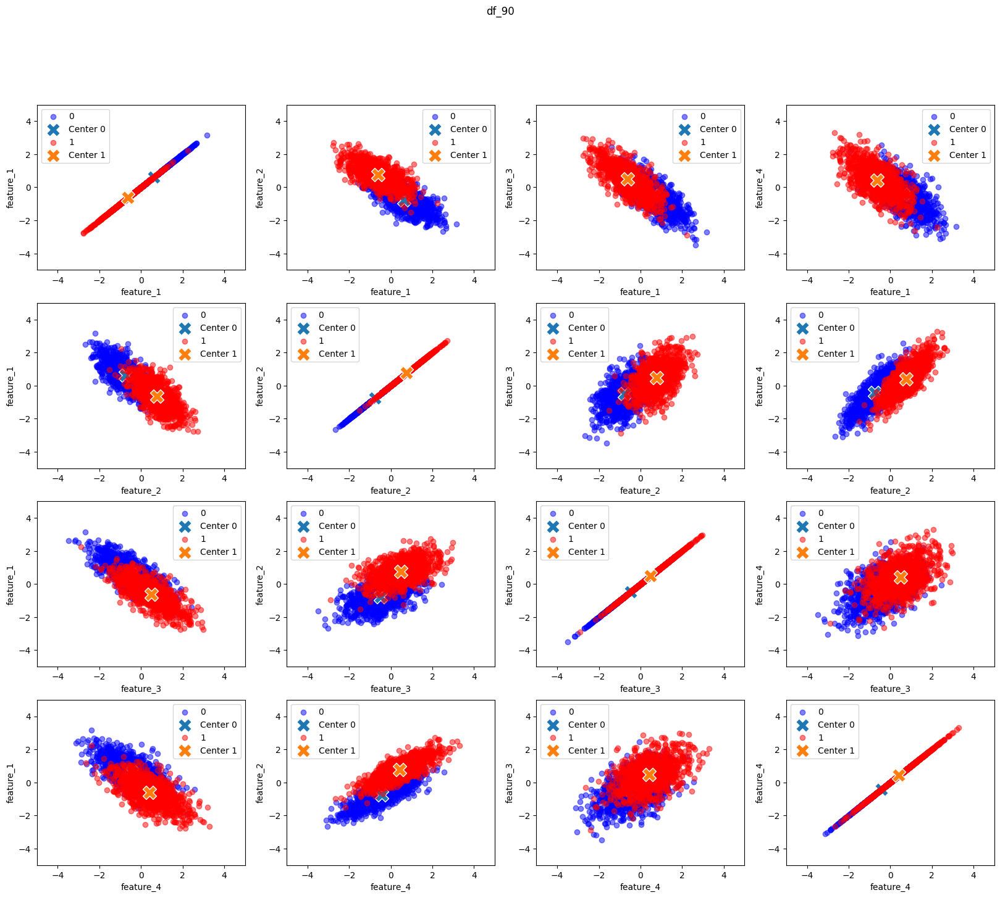

In [10]:
for (dataset_name, dataset) in zip(datasets.keys(), datasets.values()):
    calculated_centers = dataset.groupby('class').mean()
    plt.figure(figsize=(20, 16))
    for i, feature_name1 in enumerate(dataset.drop('class', axis=1).columns):
        for j, feature_name2 in enumerate(df.drop('class', axis=1).columns):
            plt.subplot(4, 4, 4 * i + j + 1)
            plt.xlabel(feature_name1)
            plt.ylabel(feature_name2)
            plt.xlim(-5, 5)
            plt.ylim(-5, 5)
            dict_color = {0: 'blue', 1: 'red'}
            for label in dict_color:
                plt.scatter(dataset[dataset['class'] == label][feature_name1], 
                            dataset[dataset['class'] == label][feature_name2], 
                            c=dict_color[label], label=label, alpha=0.5)
                
                # Центры
                plt.scatter(calculated_centers.loc[label, feature_name1], 
                            calculated_centers.loc[label, feature_name2], 
                            s=250, marker='X', edgecolor='white', label=f"Center {label}")
            plt.suptitle(f'{dataset_name}')
            plt.legend()
    plt.show()

## b)

In [24]:
from sklearn.utils import resample
from scipy.stats import norm
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KernelDensity
from matplotlib.colors import ListedColormap

In [25]:
def analyze_naive_bayes(datasets):
    results = {}

    for name, X in datasets.items():
        y = X['class']
        X = np.array(X.drop(columns=['class'], axis=1))
        n_features = X.shape[1]
        feature_pairs = [(i, j) for i in range(n_features) for j in range(i + 1, n_features)]

        for (i, j) in feature_pairs:
            # Extract feature pair
            X_pair = X[:, [i, j]]

            # Split data
            X_train, X_test, y_train, y_test = train_test_split(X_pair, y, test_size=0.3, random_state=42)

            # Train Naive Bayes
            model = GaussianNB()
            model.fit(X_train, y_train)
            y_prob = model.predict_proba(X_test)[:, 1]
            #y_pred = model.predict(X_test)

            # Calculate ROC
            fpr, tpr, thresholds = roc_curve(y_test, y_prob)
            roc_auc = auc(fpr, tpr)

            # Sensitivity-Specificity point
            idx = np.argmax(tpr - fpr)
            best_threshold = thresholds[idx]
            best_sen = tpr[idx]
            best_spe = 1 - fpr[idx]

            # Bootstrap confidence intervals
            n_bootstrap = 1000
            aucs = []
            tprs = []
            for _ in range(n_bootstrap):
                X_resampled, y_resampled = resample(X_test, y_test)
                y_prob_resampled = model.predict_proba(X_resampled)[:, 1]
                fpr_resampled, tpr_resampled, _ = roc_curve(y_resampled, y_prob_resampled)
                roc_auc_resampled = auc(fpr_resampled, tpr_resampled)
                aucs.append(roc_auc_resampled)
                tprs.append(np.interp(fpr, fpr_resampled, tpr_resampled))

            mean_auc = np.mean(aucs)
            std_auc = np.std(aucs)
            z_score = norm.ppf(0.975)  # For 95% CI
            confidence_lower = max(0, mean_auc - z_score * std_auc)
            confidence_upper = min(1, mean_auc + z_score * std_auc)

            # Visualization
            plt.figure(figsize=(12, 6))

            # # Plot feature space
            # plt.subplot(1, 2, 1)
            # plt.scatter(X_test[:, 0], X_test[:, 1], c=y_test, alpha=0.8, cmap='coolwarm', label='Test Data')
            # plt.xlabel(f'Feature {i + 1}')
            # plt.ylabel(f'Feature {j + 1}')
            # plt.title(f'{name}: Feature {i + 1} vs Feature {j + 1}')
            # plt.legend()

            plt.subplot(1, 2, 1)
            cmap_light = ListedColormap(['#FFAAAA', '#AAAAFF'])
            cmap_bold = ListedColormap(['#FF0000', '#0000FF'])

            # Разделение
            x_min, x_max = X_pair[:, 0].min() - 1, X_pair[:, 0].max() + 1
            y_min, y_max = X_pair[:, 1].min() - 1, X_pair[:, 1].max() + 1
            xx, yy = np.meshgrid(np.linspace(x_min, x_max, 200), np.linspace(y_min, y_max, 200))

            Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
            Z = Z.reshape(xx.shape)

            plt.contourf(xx, yy, Z, alpha=0.8, cmap=cmap_light)
            plt.scatter(X_test[:, 0], X_test[:, 1], c=y_test, edgecolor='k', cmap=cmap_bold)
            plt.xlabel(f'Feature {i + 1}')
            plt.ylabel(f'Feature {j + 1}')
            plt.title(f'{name}: Feature {i + 1} vs Feature {j + 1}')

            # KDE
            kde = KernelDensity(kernel='gaussian', bandwidth=0.5).fit(X_pair)
            log_density = kde.score_samples(np.c_[xx.ravel(), yy.ravel()])
            density = np.exp(log_density).reshape(xx.shape)
            plt.contour(xx, yy, density, levels=10, cmap='coolwarm', alpha=0.6)

            # ROC-curve
            plt.subplot(1, 2, 2)
            plt.plot(fpr, tpr, label=f'ROC curve (AUC = {roc_auc:.2f})')
            plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Chance')
            plt.fill_between(fpr, 
                             np.maximum(0, np.mean(tprs, axis=0) - z_score * np.std(tprs, axis=0)), 
                             np.minimum(1, np.mean(tprs, axis=0) + z_score * np.std(tprs, axis=0)), 
                             color='blue', alpha=0.2, label='95% CI')
            plt.scatter(1 - best_spe, best_sen, color='red', zorder=10, label='Best Threshold')
            plt.xlabel('1 - Specificity')
            plt.ylabel('Sensitivity')
            plt.title(f'ROC Curve with 95% CI')
            plt.legend()

            plt.tight_layout()
            plt.show()

            # # Save results
            # results[f'{name}_f{i+1}_f{j+1}'] = {
            #     'roc_auc': roc_auc,
            #     'confidence_interval': (confidence_lower, confidence_upper),
            #     'best_threshold': best_threshold,
            #     'best_sensitivity': best_sen,
            #     'best_specificity': best_spe
            # }

    # return results

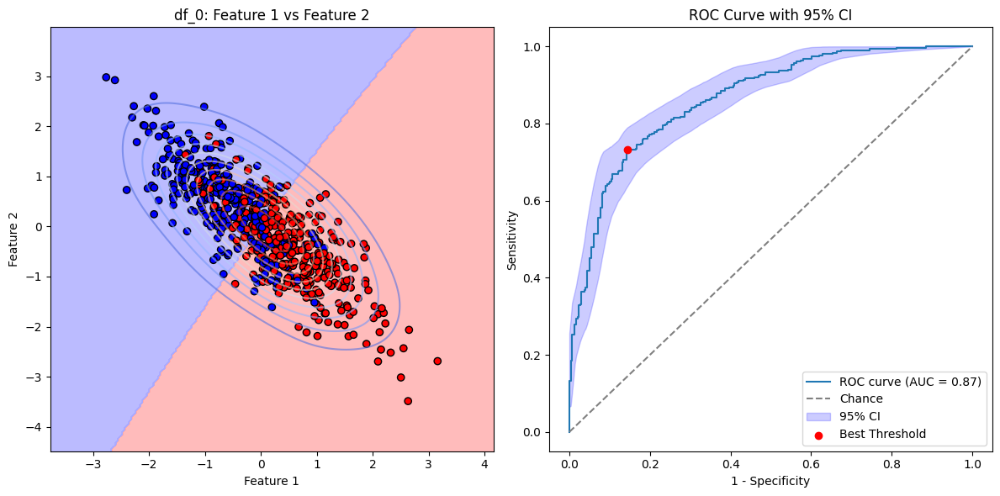

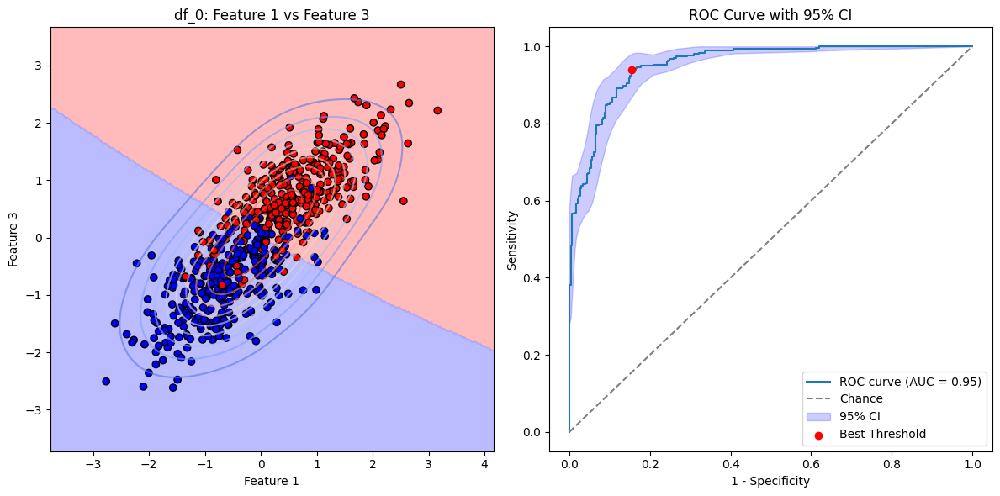

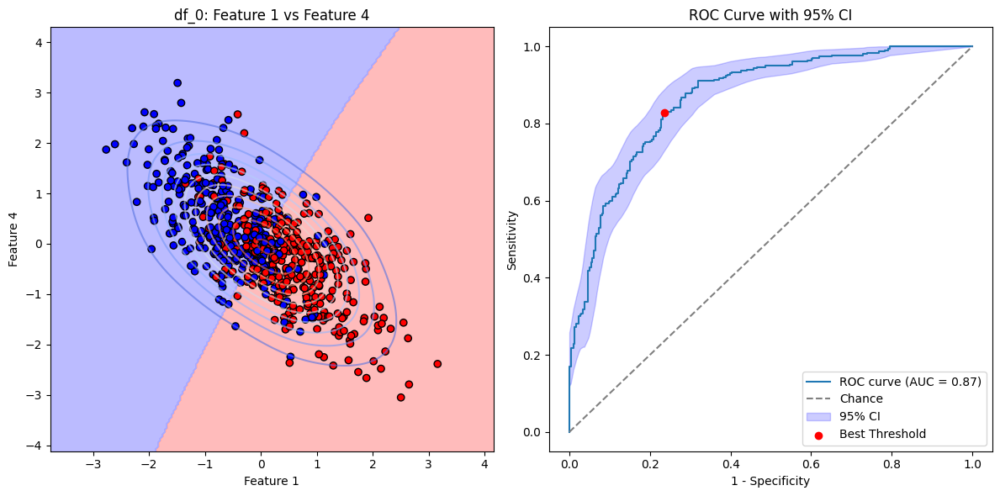

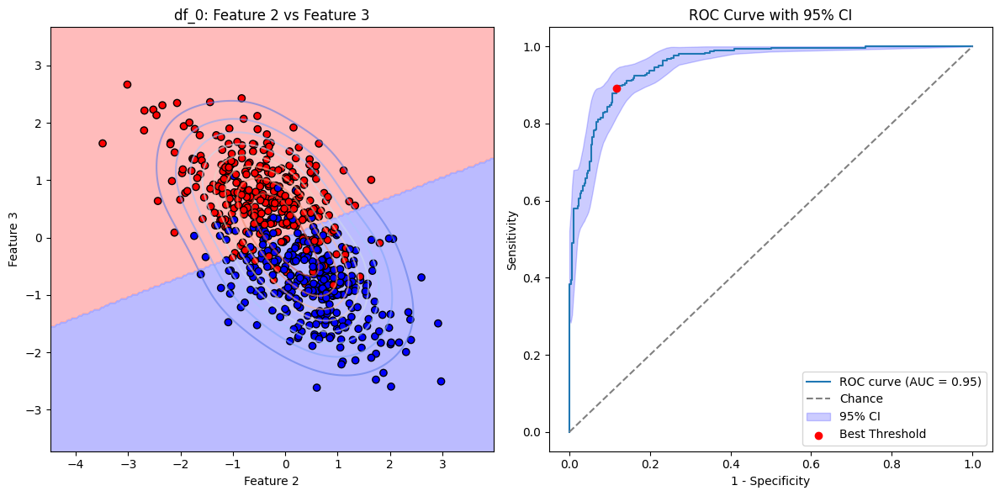

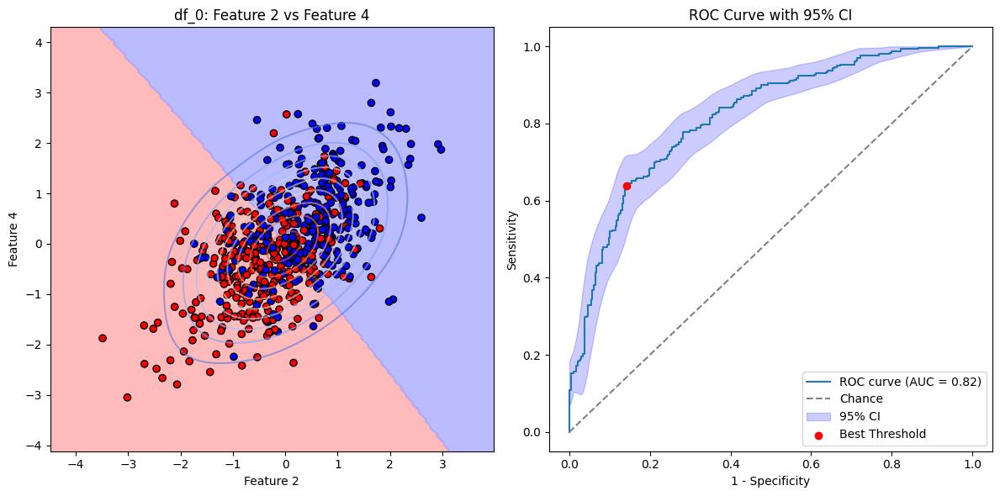

...

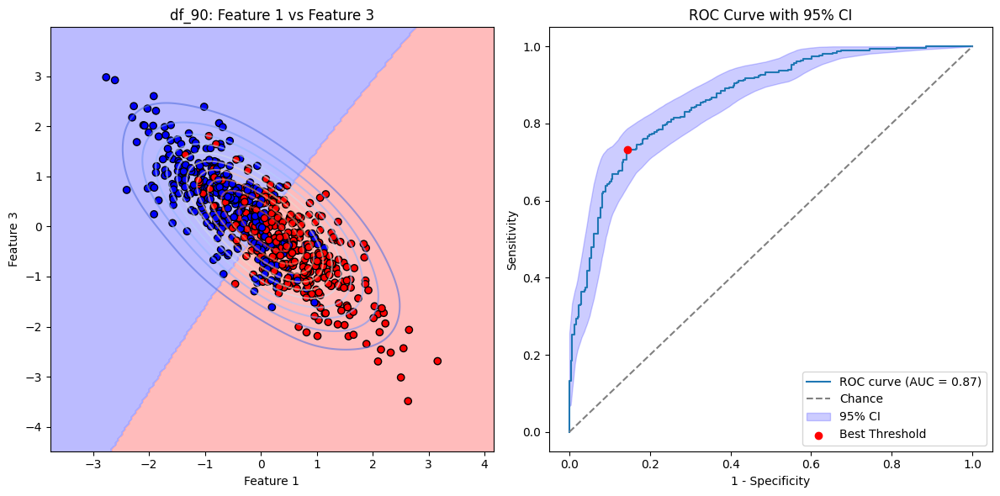

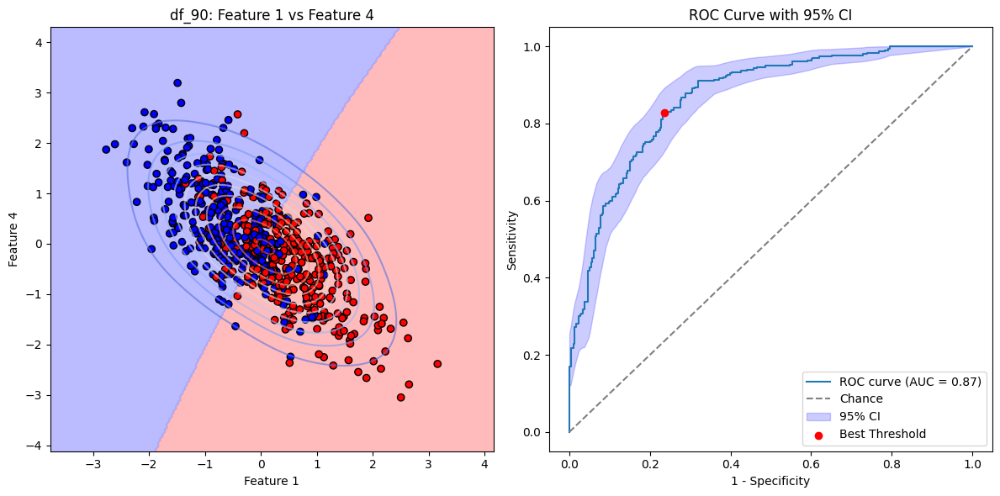

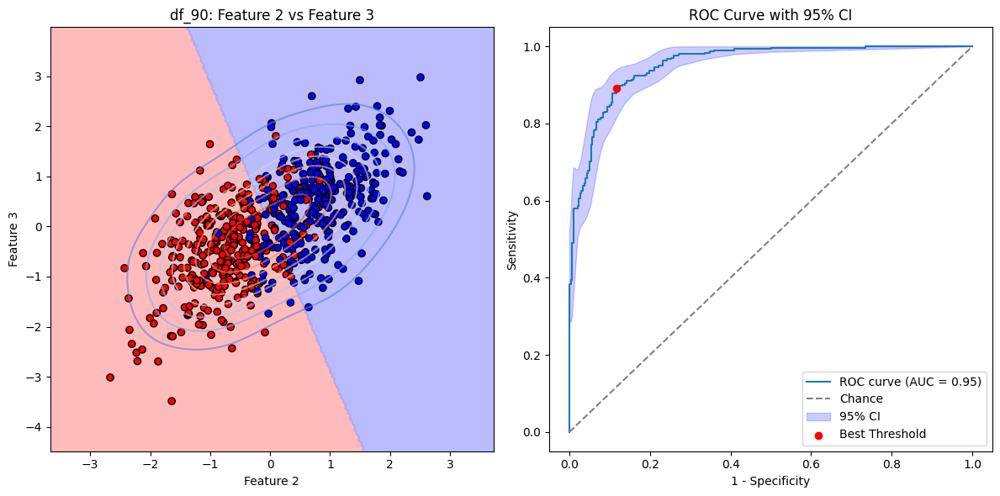

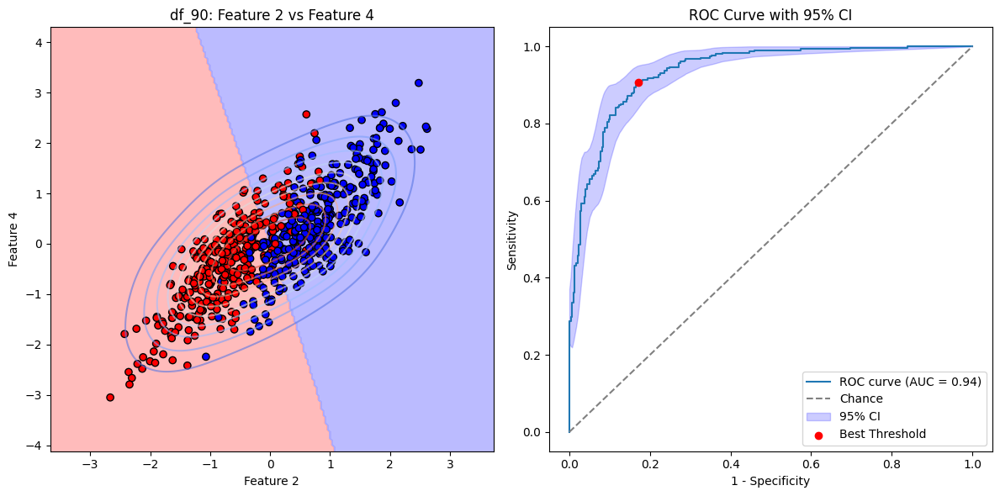

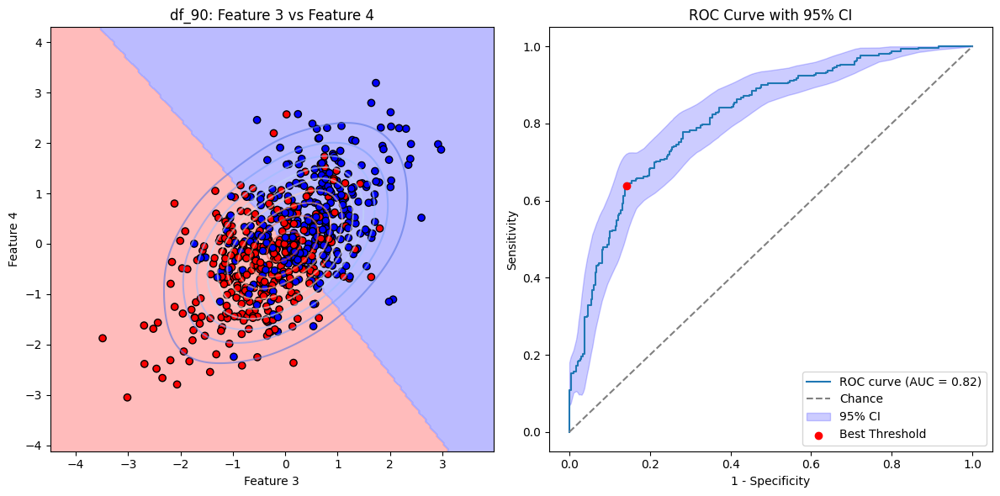

In [26]:
res = analyze_naive_bayes(datasets)

# 4.

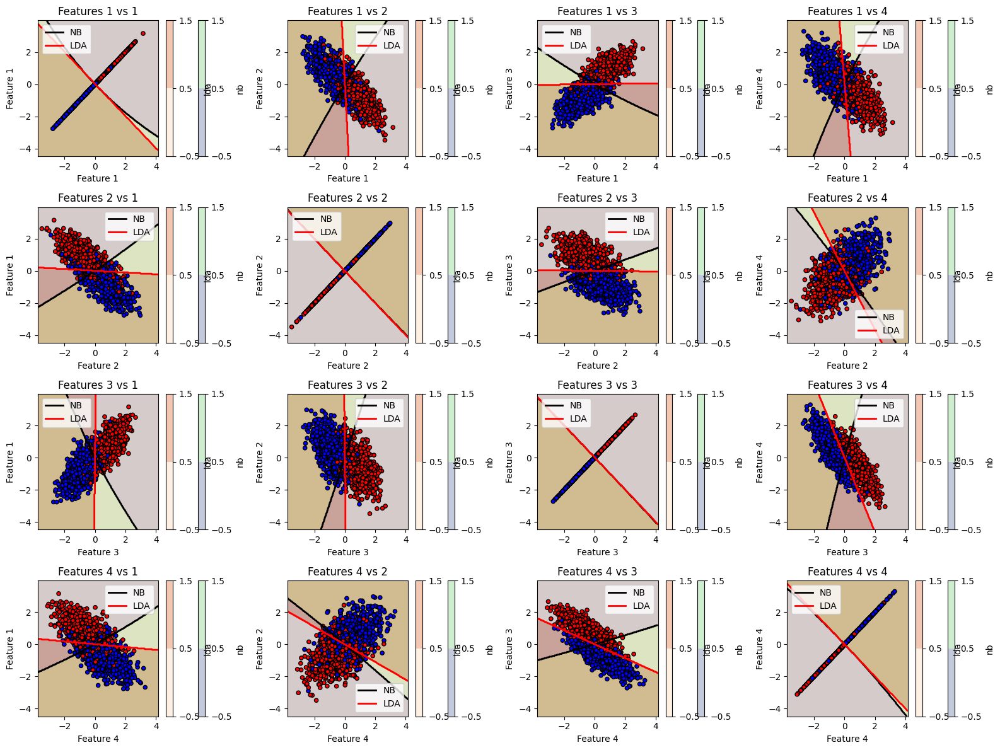

In [78]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from matplotlib.lines import Line2D

def visualize_decision_functions(df):
    X = df.drop(columns=['class']).values
    y = df['class'].values

    n_features = X.shape[1]

    # Split data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

    # Train Naive Bayes and LDA models
    nb_model = GaussianNB()
    lda_model = LinearDiscriminantAnalysis()
    
    nb_model.fit(X_train, y_train)
    lda_model.fit(X_train, y_train)

    # Create mesh grid for visualization
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 200), np.linspace(y_min, y_max, 200))
    grid = np.c_[xx.ravel(), yy.ravel()]

    plt.figure(figsize=(16, 12))

    for i in range(n_features):
        for j in range(n_features):
            plt.subplot(n_features, n_features, i * n_features + j + 1)

            # Use only two features for visualization
            X_pair = X[:, [i, j]]
            X_train_pair, X_test_pair = X_train[:, [i, j]], X_test[:, [i, j]]

            # Train models on feature pair
            nb_model.fit(X_train_pair, y_train)
            lda_model.fit(X_train_pair, y_train)

            # Predict on the grid
            Z_nb = nb_model.predict(grid[:, [0, 1]]).reshape(xx.shape)
            Z_lda = lda_model.predict(grid[:, [0, 1]]).reshape(xx.shape)

            # Plot decision boundaries
            cmap_light = ListedColormap(['#FFAAAA', '#AAAAFF'])
            contour_nb = plt.contourf(xx, yy, Z_nb, alpha=0.3, cmap='viridis', levels=[-0.5, 0.5, 1.5], linestyles=['--'])
            contour_lda = plt.contourf(xx, yy, Z_lda, alpha=0.3, cmap='Oranges', levels=[-0.5, 0.5, 1.5], linestyles=['-'])

            plt.contour(xx, yy, Z_nb, levels=[-0.5, 0.5, 1.5], colors='black', linewidths=2, label='NB')
            plt.contour(xx, yy, Z_lda, levels=[-0.5, 0.5, 1.5], colors='red', linewidths=2, label='LDA')
            legend_elements = [
                Line2D([0], [0], color='black', lw=2, label='NB'),
                Line2D([0], [0], color='red', lw=2, label='LDA')
            ]

            plt.colorbar(contour_nb, label='nb')
            plt.colorbar(contour_lda, label='lda')

            # Scatter plot of data points
            cmap_bold = ListedColormap(['#FF0000', '#0000FF'])
            plt.scatter(X_pair[:, 0], X_pair[:, 1], c=y, cmap=cmap_bold, edgecolor='k', s=20)

            plt.xlabel(f'Feature {i + 1}')
            plt.ylabel(f'Feature {j + 1}')
            plt.title(f'Features {i + 1} vs {j + 1}')
            plt.legend(handles=legend_elements)

    plt.tight_layout()
    plt.show()
visualize_decision_functions(datasets['df_0'])

# 5.

In [136]:
# pip install pandas openpyxl
mad4j = pd.read_excel('playboy-stats/playboy-stats.xlsx').drop(['Unnamed: 7'], axis=1)
mad4j.columns = mad4j.columns.str.replace('\n', '')
mad4j.columns

Index(['Decade', 'Year', 'Issue', 'Model', 'aka', 'Ethnicity', 'Shown',
       'Playmate of the Year?', 'Eye Color', 'Hair Color', 'Birthdate', 'Age',
       'Bra Size', 'CupValue', 'Cup Size', 'Bust (in)', 'Waist (in)',
       'Hips (in)', 'Height (in)', 'Height (m)', 'Weight (lbs)', 'Weight (Kg)',
       'BMI', 'USA', 'Place of Birth'],
      dtype='object')

In [137]:
mad4j['Month of Birth'] = mad4j['Birthdate'].dt.month
mad4j['Year of Birth'] = mad4j['Birthdate'].dt.year
mad4j[['Month of Birth', 'Year of Birth']]

,Month of Birth,Year of Birth
0,6,1926
1,11,1931
2,11,1931
3,3,1932
4,11,1931
...,...,...
743,9,1992
744,5,1994
745,10,1988
746,3,1990


In [138]:
mad4j['Month of Issue'] = mad4j['Issue'].dt.month
mad4j['Year of Issue'] = mad4j['Issue'].dt.year

In [139]:
mad4j_new = mad4j[['Hair Color', 'Age', 'Year of Birth', 'Month of Birth', 'Month of Issue', 'Year of Issue', 'Height (m)', 'Weight (Kg)', 'BMI', 'Bust (in)', 'Waist (in)', 'Hips (in)', 'Bra Size', 'CupValue', 'Cup Size', 'USA']]
mad4j_new['Bra Size'] = mad4j_new['Bra Size'].str.replace(r'\D', '', regex=True)
mad4j_new['Bra Size'] = mad4j_new['Bra Size'][mad4j_new['Bra Size'] != '']
mad4j_new

,Hair Color,Age,Year of Birth,Month of Birth,Month of Issue,Year of Issue,Height (m),Weight (Kg),BMI,Bust (in),Waist (in),Hips (in),Bra Size,CupValue,Cup Size,USA
0,Blonde,27,1926,6,12,1953,1.6510,53.523856,19.636010,36.0,24.0,34.0,36,3.0,D,Y
1,Brunette,23,1931,11,1,1954,1.6510,45.359200,16.640687,36.0,26.0,37.0,36,2.0,C,Y
2,Blonde,23,1931,11,2,1954,1.6256,51.255896,19.396191,36.0,23.0,34.0,36,2.0,C,Y
3,Brunette,22,1932,3,3,1954,1.6764,53.523856,19.045487,34.0,24.0,35.0,34,1.0,B,Y
4,Blonde,23,1931,11,4,1954,1.6256,51.255896,19.396191,36.0,23.0,34.0,36,2.0,C,Y
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
743,Brunette,23,1992,9,3,2015,1.6510,53.070264,19.469603,34.0,26.0,31.0,34,4.0,DD,Y
744,Brunette,21,1994,5,4,2015,1.7526,58.966960,19.197431,32.0,24.0,35.0,32,2.0,C,Y
745,Brunette,27,1988,10,5,2015,1.7018,49.895120,17.228245,32.0,24.0,36.0,32,1.0,B,Y
746,Brunette,25,1990,3,6,2015,1.6764,53.070264,18.884085,32.0,25.0,34.0,32,1.0,B,Y


In [140]:
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
catedorial_features = ['Hair Color', 'Cup Size', 'USA']

for catedorial_feature in catedorial_features:
    mad4j_new[catedorial_feature] = label_encoder.fit_transform(mad4j_new[catedorial_feature])
mad4j_new

,Hair Color,Age,Year of Birth,Month of Birth,Month of Issue,Year of Issue,Height (m),Weight (Kg),BMI,Bust (in),Waist (in),Hips (in),Bra Size,CupValue,Cup Size,USA
0,0,27,1926,6,12,1953,1.6510,53.523856,19.636010,36.0,24.0,34.0,36,3.0,3,1
1,1,23,1931,11,1,1954,1.6510,45.359200,16.640687,36.0,26.0,37.0,36,2.0,2,1
2,0,23,1931,11,2,1954,1.6256,51.255896,19.396191,36.0,23.0,34.0,36,2.0,2,1
3,1,22,1932,3,3,1954,1.6764,53.523856,19.045487,34.0,24.0,35.0,34,1.0,1,1
4,0,23,1931,11,4,1954,1.6256,51.255896,19.396191,36.0,23.0,34.0,36,2.0,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
743,1,23,1992,9,3,2015,1.6510,53.070264,19.469603,34.0,26.0,31.0,34,4.0,4,1
744,1,21,1994,5,4,2015,1.7526,58.966960,19.197431,32.0,24.0,35.0,32,2.0,2,1
745,1,27,1988,10,5,2015,1.7018,49.895120,17.228245,32.0,24.0,36.0,32,1.0,1,1
746,1,25,1990,3,6,2015,1.6764,53.070264,18.884085,32.0,25.0,34.0,32,1.0,1,1


# 6.

In [141]:
from sklearn.impute import SimpleImputer, KNNImputer
from fancyimpute import IterativeImputer # for MICE #pip install fancyimpute

In [142]:
# for col in mad4j_new.columns:
#     print(f'{col}: ', mad4j_new[col].unique())
# mad4j_new['Bra Size'] = mad4j_new['Bra Size'][mad4j_new['Bra Size'] != '']

In [180]:
# Удалили NaN
mad4j_dropna = mad4j_new.dropna()

# Медиана
imputer_median = SimpleImputer(strategy='median')
mad4j_median = pd.DataFrame(imputer_median.fit_transform(mad4j_new), columns=mad4j_new.columns)

# MICE
mice_imputer = IterativeImputer()
mad4j_mice = pd.DataFrame(mice_imputer.fit_transform(mad4j_new), columns=mad4j_new.columns)

# KNN
knn_imputer = KNNImputer(n_neighbors=2)
mad4j_knn = pd.DataFrame(knn_imputer.fit_transform(mad4j_new), columns=mad4j_new.columns)

datasets_NaN = {'mad4j_dropna': mad4j_dropna, 
                'mad4j_median': mad4j_median, 
                'mad4j_mice': mad4j_mice,
                'mad4j_knn': mad4j_knn}

# 7-8.

In [ ]:
def analyze_naive_bayes_8(datasets):
    results = {}

    for name, X in datasets.items():
        y = X['class']
        X = np.array(X.drop(columns=['class'], axis=1))
        n_features = X.shape[1]
        feature_pairs = [(i, j) for i in range(n_features) for j in range(i + 1, n_features)]

        for (i, j) in feature_pairs:
            # Extract feature pair
            X_pair = X[:, [i, j]]

            # Split data
            X_train, X_test, y_train, y_test = train_test_split(X_pair, y, test_size=0.3, random_state=42)

            # Train Naive Bayes
            model = GaussianNB()
            model.fit(X_train, y_train)
            y_prob = model.predict_proba(X_test)[:, 1]
            #y_pred = model.predict(X_test)

            # Calculate ROC
            fpr, tpr, thresholds = roc_curve(y_test, y_prob)
            roc_auc = auc(fpr, tpr)

            # Sensitivity-Specificity point
            idx = np.argmax(tpr - fpr)
            best_threshold = thresholds[idx]
            best_sen = tpr[idx]
            best_spe = 1 - fpr[idx]

            # Bootstrap confidence intervals
            n_bootstrap = 1000
            aucs = []
            tprs = []
            for _ in range(n_bootstrap):
                X_resampled, y_resampled = resample(X_test, y_test)
                y_prob_resampled = model.predict_proba(X_resampled)[:, 1]
                fpr_resampled, tpr_resampled, _ = roc_curve(y_resampled, y_prob_resampled)
                roc_auc_resampled = auc(fpr_resampled, tpr_resampled)
                aucs.append(roc_auc_resampled)
                tprs.append(np.interp(fpr, fpr_resampled, tpr_resampled))

            mean_auc = np.mean(aucs)
            std_auc = np.std(aucs)
            z_score = norm.ppf(0.975)  # For 95% CI
            confidence_lower = max(0, mean_auc - z_score * std_auc)
            confidence_upper = min(1, mean_auc + z_score * std_auc)

            # Visualization
            plt.figure(figsize=(12, 6))

            # # Plot feature space
            # plt.subplot(1, 2, 1)
            # plt.scatter(X_test[:, 0], X_test[:, 1], c=y_test, alpha=0.8, cmap='coolwarm', label='Test Data')
            # plt.xlabel(f'Feature {i + 1}')
            # plt.ylabel(f'Feature {j + 1}')
            # plt.title(f'{name}: Feature {i + 1} vs Feature {j + 1}')
            # plt.legend()

            plt.subplot(1, 2, 1)
            cmap_light = ListedColormap(['#FFAAAA', '#AAAAFF'])
            cmap_bold = ListedColormap(['#FF0000', '#0000FF'])

            # Разделение
            x_min, x_max = X_pair[:, 0].min() - 1, X_pair[:, 0].max() + 1
            y_min, y_max = X_pair[:, 1].min() - 1, X_pair[:, 1].max() + 1
            xx, yy = np.meshgrid(np.linspace(x_min, x_max, 200), np.linspace(y_min, y_max, 200))

            Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
            Z = Z.reshape(xx.shape)

            plt.contourf(xx, yy, Z, alpha=0.8, cmap=cmap_light)
            plt.scatter(X_test[:, 0], X_test[:, 1], c=y_test, edgecolor='k', cmap=cmap_bold)
            plt.xlabel(f'Feature {i + 1}')
            plt.ylabel(f'Feature {j + 1}')
            plt.title(f'{name}: Feature {i + 1} vs Feature {j + 1}')

            # KDE
            kde = KernelDensity(kernel='gaussian', bandwidth=0.5).fit(X_pair)
            log_density = kde.score_samples(np.c_[xx.ravel(), yy.ravel()])
            density = np.exp(log_density).reshape(xx.shape)
            plt.contour(xx, yy, density, levels=10, cmap='coolwarm', alpha=0.6)

            # ROC-curve
            plt.subplot(1, 2, 2)
            plt.plot(fpr, tpr, label=f'ROC curve (AUC = {roc_auc:.2f})')
            plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Chance')
            plt.fill_between(fpr, 
                             np.maximum(0, np.mean(tprs, axis=0) - z_score * np.std(tprs, axis=0)), 
                             np.minimum(1, np.mean(tprs, axis=0) + z_score * np.std(tprs, axis=0)), 
                             color='blue', alpha=0.2, label='95% CI')
            plt.scatter(1 - best_spe, best_sen, color='red', zorder=10, label='Best Threshold')
            plt.xlabel('1 - Specificity')
            plt.ylabel('Sensitivity')
            plt.title(f'ROC Curve with 95% CI')
            plt.legend()

            plt.tight_layout()
            plt.show()

            # # Save results
            # results[f'{name}_f{i+1}_f{j+1}'] = {
            #     'roc_auc': roc_auc,
            #     'confidence_interval': (confidence_lower, confidence_upper),
            #     'best_threshold': best_threshold,
            #     'best_sensitivity': best_sen,
            #     'best_specificity': best_spe
            # }

    # return results

In [215]:
X_train, X_test, y_train, y_test = train_test_split(mad4j_dropna.drop(['Hair Color'], axis=1), mad4j_dropna['Hair Color'], test_size=0.3, random_state=42)

model_dropna = GaussianNB()
model_dropna.fit(X_train, y_train)

for col in mad4j_dropna.drop(['Hair Color']).columns:
    y_prob = model_dropna.predict_proba(mad4j_dropna[col])
    for i in range(y_prob.shape[1]):
        # Calculate ROC
        fpr, tpr, thresholds = roc_curve(y_test==i, y_prob[:, i])
        roc_auc = auc(fpr, tpr)

        # Sensitivity-Specificity point
        idx = np.argmax(tpr - fpr)
        best_threshold = thresholds[idx]
        best_sen = tpr[idx]
        best_spe = 1 - fpr[idx]

        # Bootstrap confidence intervals
        n_bootstrap = 1000
        aucs = []
        tprs = []
        for _ in range(n_bootstrap):
            X_resampled, y_resampled = resample(X_test, y_test)
            y_prob_resampled = model_dropna.predict_proba(X_resampled)[:, 1]
            fpr_resampled, tpr_resampled, _ = roc_curve(y_resampled, y_prob_resampled)
            roc_auc_resampled = auc(fpr_resampled, tpr_resampled)
            aucs.append(roc_auc_resampled)
            tprs.append(np.interp(fpr, fpr_resampled, tpr_resampled))

        mean_auc = np.mean(aucs)
        std_auc = np.std(aucs)
        z_score = norm.ppf(0.975)  # For 95% CI
        confidence_lower = max(0, mean_auc - z_score * std_auc)
        confidence_upper = min(1, mean_auc + z_score * std_auc)

        plt.figure(figsize=(12, 6))

GaussianNB()